In [1]:
from data_prep import DistanceData, FireData
import numpy as np
from tqdm.auto import tqdm

In [2]:
def generate_data(data_generator):
    with tqdm(total=len(data_generator) // 100, desc='Iterating through Data') as progress_bar_:
        mean = .0
        std = .0
        maximum = -np.inf
        minimum = np.inf
        for index_ in range(len(data_generator) // 100):
            x_, y_ = data_generator[index_]
            mean += np.mean(y_)
            std += np.std(y_) / (index_ + 1)
            maximum = max(maximum, np.max(y_))
            minimum = min(minimum, np.min(y_))
            progress_bar_.set_postfix_str(s=f'Mean: {mean / ((index_ + 1) * 4 * y_.size)} | '
                                            f'St dev.: {std} | Max: {maximum} | Min: {minimum}')
            progress_bar_.update()
    data_generator.plot()

Iterating through Data:   0%|          | 0/127 [00:00<?, ?it/s]

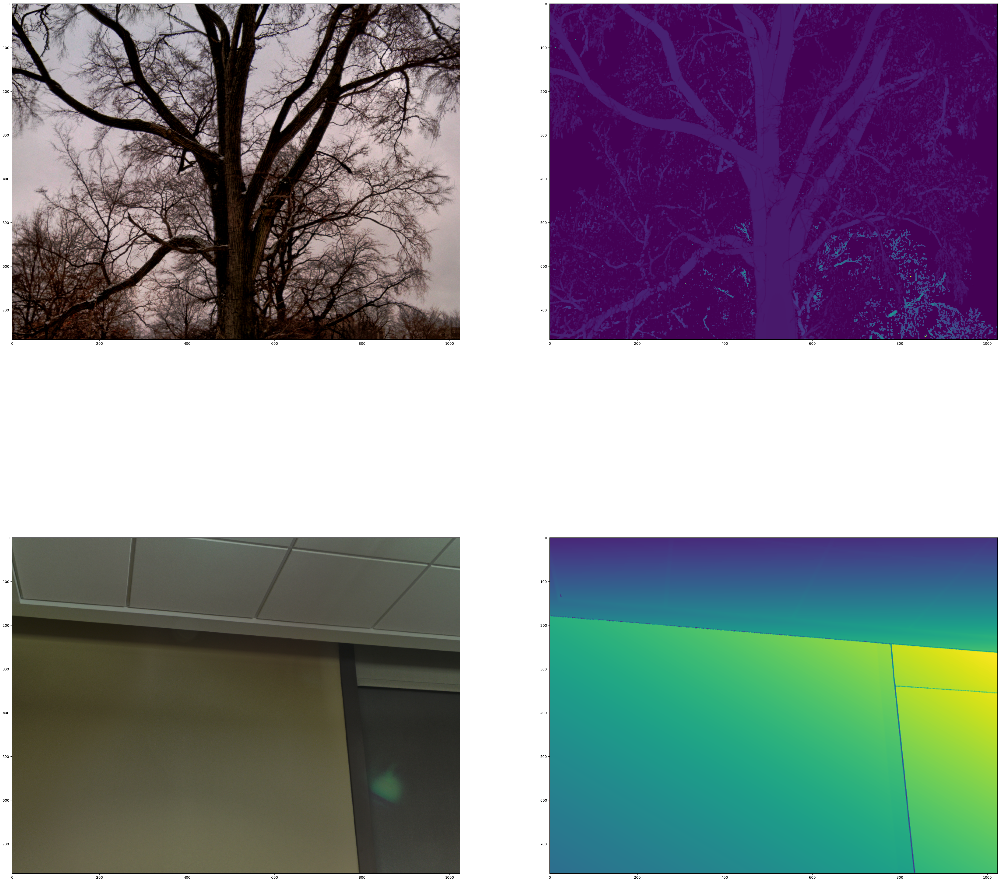

In [3]:
data_generator_distance = DistanceData(batch_size=2, split='train', create_csv=False, unpack=False)
generate_data(data_generator_distance)

Creating Archive:   0%|          | 0/54922 [00:00<?, ?it/s]

Creating Archive:   0%|          | 0/54922 [00:00<?, ?it/s]

Iterating through Data:   0%|          | 0/109 [00:00<?, ?it/s]

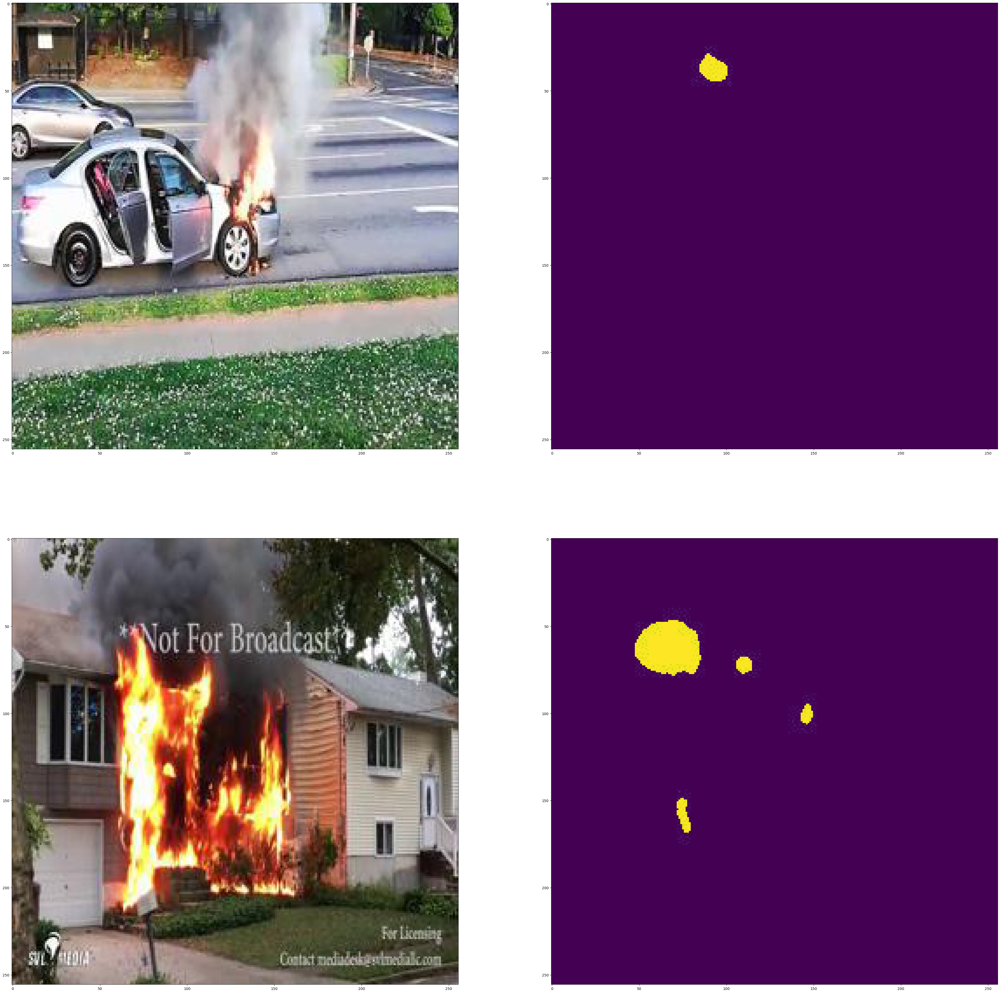

In [4]:
data_generator_fire = FireData(batch_size=2, split='train', create_csv=True, unpack=False)
generate_data(data_generator_fire)